# EDA I HW notebook
## Author: Fiona Fan


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import seaborn as sns
# from ggplot import *

% matplotlib inline
# %matplotlib gtk
pd.options.display.max_seq_items = 2000



In [3]:
gss = pd.read_csv('gss2012.csv')
# all numeric vairables
all_names = gss.columns
numeric_names = gss._get_numeric_data().columns
gss_num = gss[numeric_names]
print (f'The numerical variables are {gss_num.columns}')
# all categorical variables
cat_names = np.setdiff1d (all_names, numeric_names)
gss_cat = gss[cat_names]
print (f'The categorical variables are {list(gss_cat.columns)}')
# gss['libhomo']


The numerical variables are Index(['year', 'id', 'sibs', 'childs', 'age', 'size', 'eqwlth', 'closeblk',
       'closewht', 'tvhours', 'helpnot', 'helpblk', 'wordsum', 'dateintv',
       'cohort', 'feelevel', 'lngthinv', 'intage', 'intyrs', 'wtss',
       'social_trust', 'con_govt', 'social_connect', 'abortion',
       'authoritarianism', 'femrole', 'science_quiz', 'egalit_scale',
       'white_traits', 'black_traits', 'int_info_scale', 'tolerance',
       'wtssall', 'age.f', 'mslm_spk.high', 'mslm_spk.yes', 'grass.legal',
       'dem', 'science_quiz.f'],
      dtype='object')
The categorical variables are ['abany', 'abdefect', 'abhlth', 'abnomore', 'abortion_3', 'abpoor', 'abrape', 'absingle', 'affrmact', 'affrmact2', 'age2', 'age_3', 'age_5', 'attend', 'attend2', 'attend3', 'attend7', 'bible', 'black', 'born', 'cappun', 'closeblk2', 'closewht2', 'colath', 'colcom', 'colhomo', 'colmil', 'colmslm', 'colrac', 'conarmy', 'conbus', 'conclerg', 'coneduc', 'confed', 'confinan', 'conjudge', '

## Book-keeping variables
Numerical Variables to explore: ['authoritarianism', 'age', 'childs', 'eqwlth', 'closeblk', 'closewht', 'helpnot', 'helpblk',  'social_trust', 'con_govt', 'social_connect', 'egalit_scale', 'tolerance'] 


* demographics: ['age', 'childs']  
* ideology: [ 'eqwlth','authoritarianism']  
* race: ['closeblk', 'closewht']  
* government intervention: ['helpnot', 'helpblk']  
* government opinion: ['social_trust', 'con_govt']  
* self-reported scale: ['egalit_scale', 'tolerance', 'social_connect']  



Categorical Variables to explore:  'abany', 'affrmact2', 'attend3', 'bible','black','born', 'cappun', 'colath', 'colrac', 'colcom','colmil', 'conbus', 'coneduc', 'confed', 'confinan','conjudge', 'conlabor', 'conlegis', 'conmedic','conpress', 'consci', 'degree', 'ethnic', 'evangelical', 'fefam',  'fechld', 'fund2', 'grass', 'gunlaw', 'happy', 'helpoth', 'helppoor', 'helpsick', 'hhtype1', 'income06', 'intecon', 'intenvir', 'intethn',  'marital', 'militarist_tol', 'nataid', 'natenrgy', 'natenvir', 'natfare', 'natheal', 'natmass', 'natpark', 'natrace', 'natroad', 'natsoc', 'natspac', 'news', 'owngun', 'partyid_3', 'polviews', 'pornlaw', 'postlife', 'racdif1','sex', 'social_cons3', 'spend3', 'uscitzn', 'voted08','workhard', 'wrkgvt', 'wrkslf', 'wrkstat'

* demographics: ['born','degree', 'ethnic', 'evangelical', 'owngun', 'marital', 'hhtype1', 'income06', 'partyid_3','sex', 'uscitzn', 'voted08']  
* women: ['abany', 'fefam',  'fechld']  
* race: ['affrmact2', 'ethnic']  
* religion: ['attend3', 'bible',  'postlife', 'pornlaw']  
* policy: ['cappun', 'grass', 'gunlaw', 'helpoth', 'helppoor', 'helpsick']  
* opinion: ['colcom','colmil','conbus','coneduc', 'confed', 'confinan','conjudge', 'conlabor', 'conlegis', 'conmedic','conpress', 'consci', 'nataid', 'natenrgy', 'natenvir', 'natfare', 'natheal', 'natmass', 'natpark', 'natrace', 'natroad', 'natsoc', 'natspac',]  
* self_reported: ['happy', 'polviews','social_cons3', 'spend3']  
* work: ['workhard', 'wrkgvt', 'wrkslf', 'wrkstat', 'income06']  




## Exploring Numerical Variables

In [4]:
num_vars = ['authoritarianism', 'age', 'childs', 'eqwlth', 'closeblk', 'closewht', 'helpnot', 'helpblk',
            'wordsum', 'age', 'social_trust', 'con_govt', 'social_connect', 'egalit_scale', 'tolerance']

num_dict = dict()
for i in num_vars:
    num_dict[i] = gss[i].dropna()
dem = ['age', 'childs']
idea = [ 'eqwlth','authoritarianism']
race= ['closeblk', 'closewht']
gov_int= ['helpnot', 'helpblk']
gov_opi = ['social_trust', 'con_govt']
scales = ['egalit_scale', 'tolerance', 'social_connect']
features = {'idea':idea, 'race':race, 'gov_int':gov_int, 'gov_opi':gov_opi, 'scales':scales}


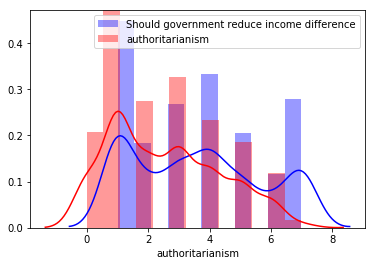

In [5]:


# num_dict = pd.DataFrame(num_dict)
# cat_dict = pd.DataFrame(cat_dict)
# print (type(num_dict['eqwlth']))

# # for var in num_vars:
# #     % matplotlib inline
#     sns.set(color_codes=True)
#     f, ax = plt.subplots(1, 1)
#     to_plot = gss[var].dropna()
#     sns.distplot(to_plot, bins=int(gss[var].max()-gss[var].min()))
#     ax.set (xlabel = 'Value',ylabel = 'Frequency (%)')
#     ax.set_title(var)
#     display(f)
#     # sns.kdeplot(to_plot, shade=True);
#     print (gss[var].describe())


f, ax = plt.subplots(1, 1)
sns.distplot( num_dict['eqwlth'], color="blue", label="Should government reduce income difference")
sns.distplot( num_dict['authoritarianism'], color="red", label="authoritarianism")
plt.legend()



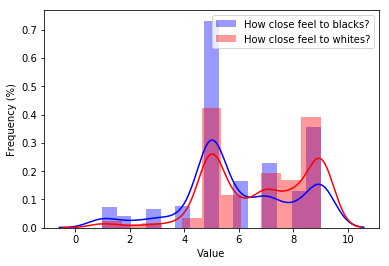

In [6]:
f, ax = plt.subplots(1, 1)
sns.distplot( num_dict['closeblk'], color="blue", label="How close feel to blacks?")
sns.distplot( num_dict['closewht'], color="red", label="How close feel to whites?")
ax.set(xlabel='Value', ylabel='Frequency (%)')
plt.legend()


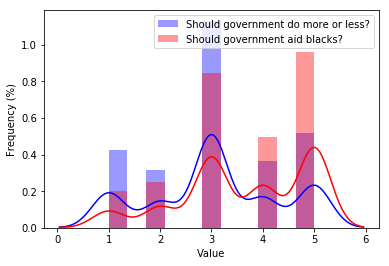

In [7]:

f, ax = plt.subplots(1, 1)
sns.distplot( num_dict['helpnot'], color="blue", label="Should government do more or less?")
sns.distplot( num_dict['helpblk'], color="red", label="Should government aid blacks?")
ax.set(xlabel='Value', ylabel='Frequency (%)')
plt.legend()


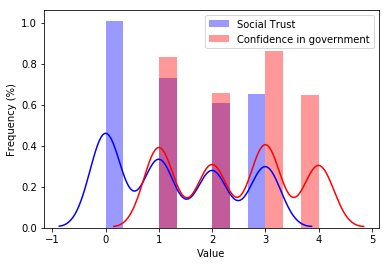

In [8]:

f, ax = plt.subplots(1, 1)
sns.distplot( num_dict['social_trust'], color="blue", label="Social Trust")
sns.distplot( num_dict['con_govt'], color="red", label="Confidence in government")
ax.set(xlabel='Value', ylabel='Frequency (%)')
plt.legend()


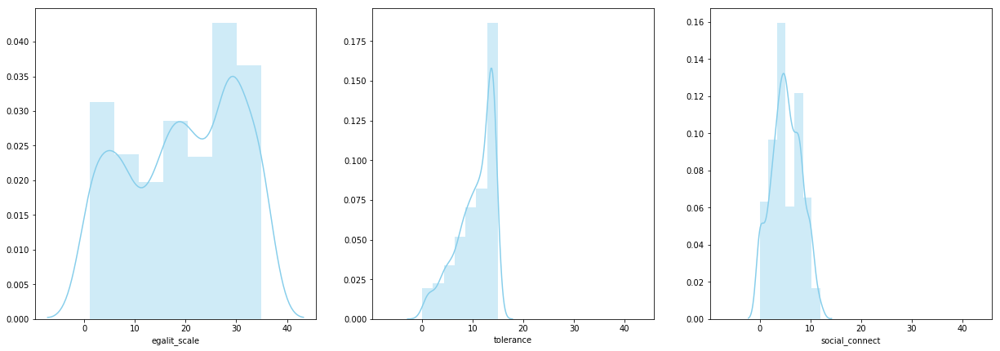

In [9]:

f, axes = plt.subplots(1,len(scales), figsize=(21, 7), sharex=True)
for i,name in enumerate(scales):
    sns.distplot( num_dict[name], hist=True, bins=7, color="skyblue", ax=axes[i])
    ax.set(xlabel='Value', ylabel='Frequency (%)', title = name)
#     sns.distplot( num_dict['childs'],hist=True,bins=7, color="olive", ax=axes[1])


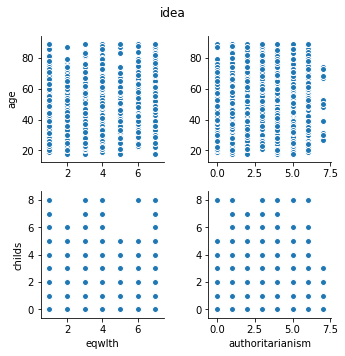

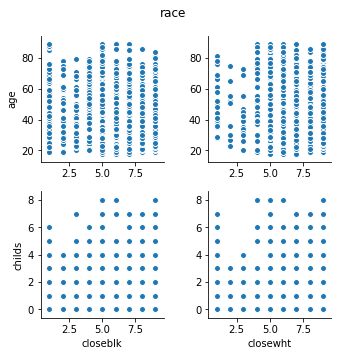

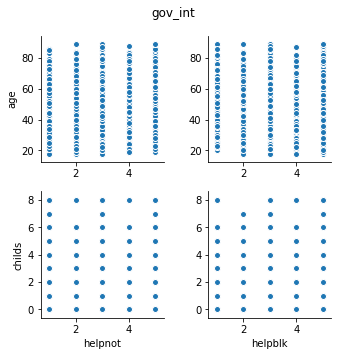

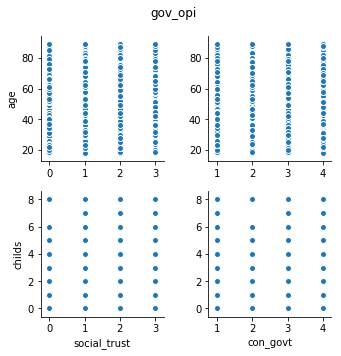

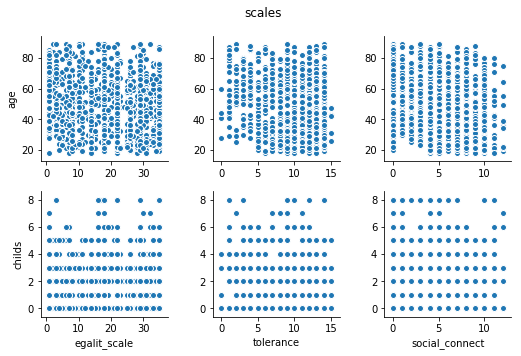

In [10]:

for name, item in features.items():
#     f, ax = plt.subplots(1, 1)
    pp = sns.pairplot(data=pd.DataFrame(num_dict),
                      y_vars=dem,
                      x_vars=item)
    plt.subplots_adjust(top=0.9)
    pp.fig.suptitle(name)
#     pp.set(title = name)


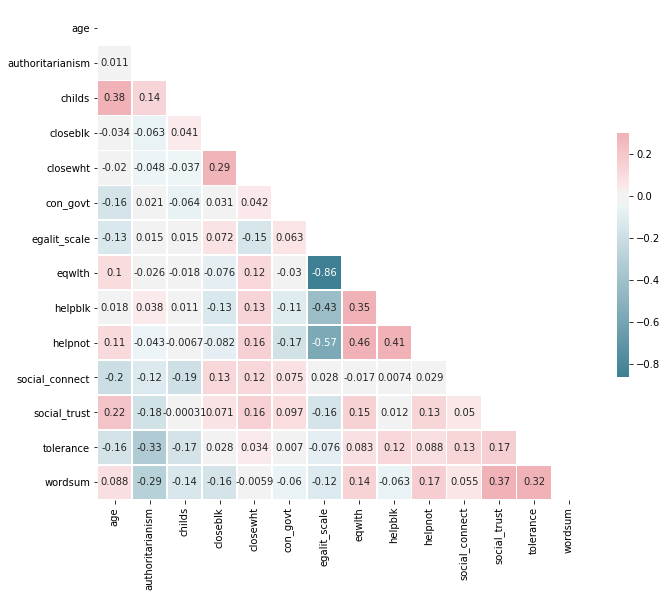

In [11]:

corr = pd.DataFrame(num_dict).corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, annot=True, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X>clip[0], X<clip[1])] # won't work for two columns.
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:454: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X>clip[0], X<clip[1])] # won't work for two columns.


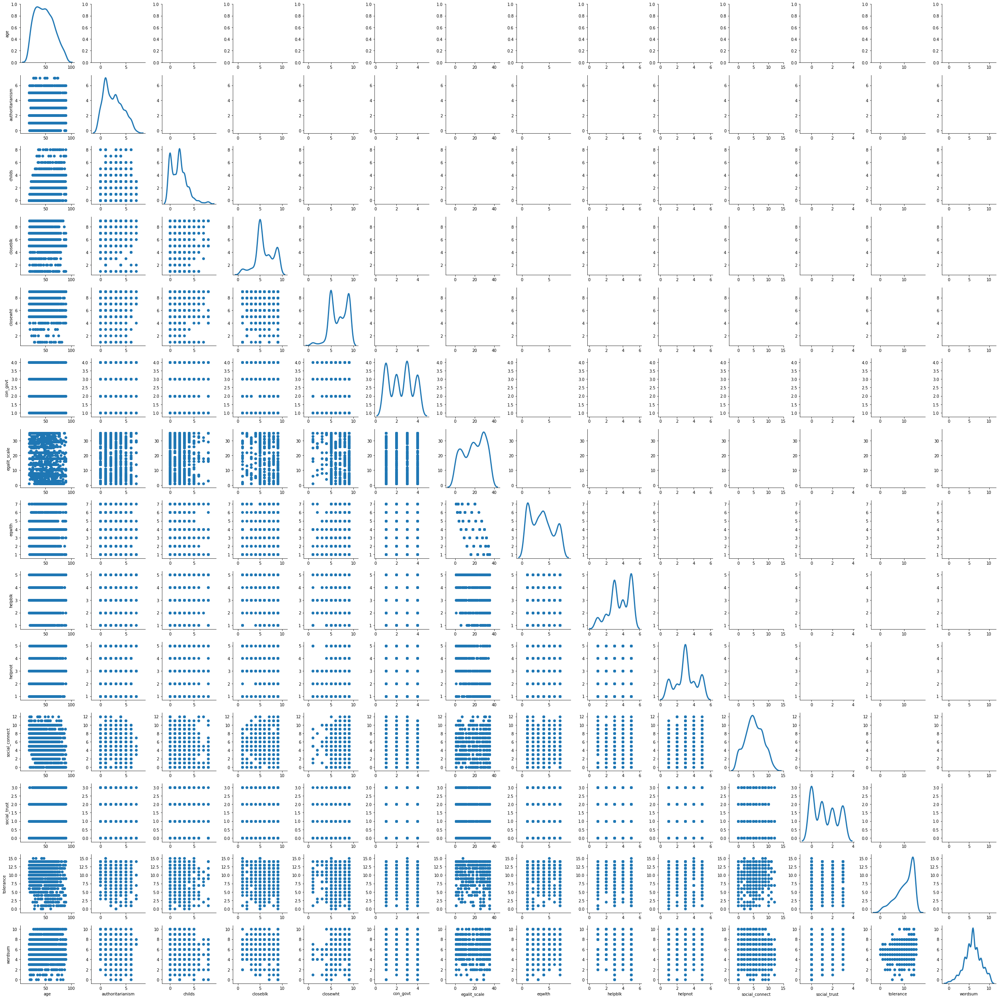

In [21]:
# f, ax = plt.subplots(1, 1)
g = sns.PairGrid(pd.DataFrame(num_dict), diag_sharey=False)
# g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_lower(plt.scatter)
# g.map_upper (sns.lmplot, label=label)
g.map_diag(sns.kdeplot,  lw=3, legend=False)

* eqwlth, helpblk, helpnot are negatively correlated with egalit_scale
* eqwlth is positively correlated iwht helpblk, and helpnot
* helpnot is positively corerlated wiht helpblk
* positive correlation between childs and age
* age, wordsum are positively correlated iwht social trust
* positive correlation between wordsum and tolerance
* positive correlation between closewht and closeblk

## Exploring Categorical Variables


In [ ]:
cat_vars = ['abany', 'affrmact2', 'attend3', 'bible','black','born', 'cappun', 'colath', 'colrac', 'colcom',
            'colmil', 'conbus', 'coneduc', 'confed', 'confinan','conjudge', 'conlabor', 'conlegis', 'conmedic',
            'conpress', 'consci', 'degree', 'ethnic', 'evangelical', 'fefam',  'fechld', 'fund2', 'grass', 'gunlaw', 
            'happy', 'helpoth', 'helppoor', 'helpsick', 'hhtype1', 'income06', 'intecon', 'intenvir', 'intethn', 'kids', 
            'marital', 'militarist_tol', 'nataid', 'natenrgy', 'natenvir', 'natfare', 'natheal', 'natmass', 'natpark', 
            'natrace', 'natroad', 'natsoc', 'natspac', 'news', 'owngun', 'partyid_3', 'polviews', 'pornlaw', 'postlife', 
            'racdif1','sex', 'social_cons3', 'spend3', 'uscitzn', 'voted08','workhard', 'wrkgvt', 'wrkslf', 'wrkstat'] 
cat_dict = dict()
for j in cat_vars:
    cat_dict[j] = gss[j].dropna()
    
dem_cat = ['degree', 'ethnic', 'owngun', 'marital', 'income06', 'partyid_3','sex']
women= ['abany', 'fefam']
policy = ['cappun', 'grass', 'gunlaw', 'pornlaw', 'affrmact2']
self_reported = ['happy', 'polviews', 'spend3']
features_cat = {'women':women, 'policy':policy, 'self_reported':self_reported}

religion= ['attend3', 'bible', 'postlife']
opinion = ['colcom','colmil','conbus','coneduc', 'confed', 'confinan','conlabor', 'conmedic','conpress', 
           'nataid',  'natfare', 'natheal', 'natrace']
work= ['workhard', 'wrkgvt', 'wrkslf', 'wrkstat', 'income06']

D:\programs\Anaconda3\lib\site-packages\seaborn\categorical.py:1508: FutureWarning:

remove_na is deprecated and is a private function. Do not use.

D:\programs\Anaconda3\lib\site-packages\matplotlib\pyplot.py:523: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



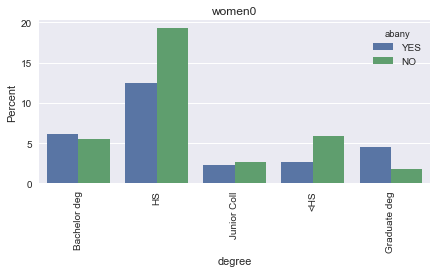

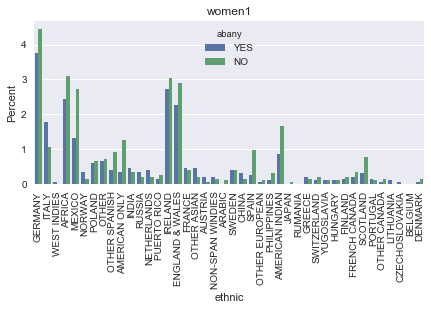

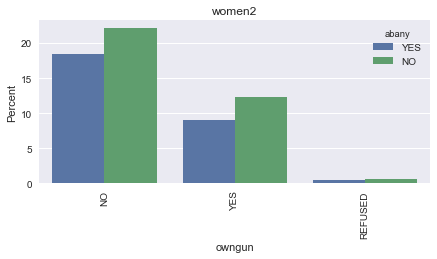

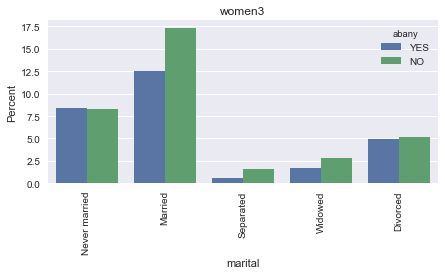

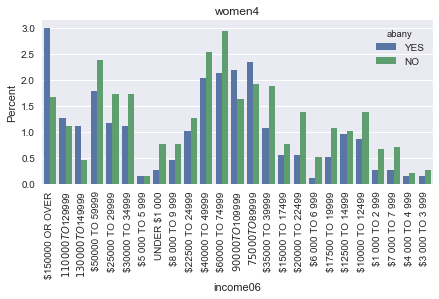

...

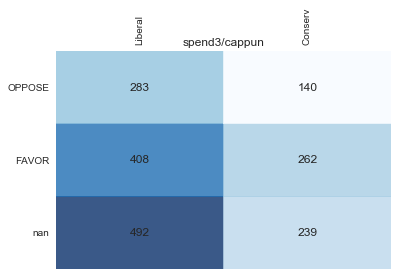

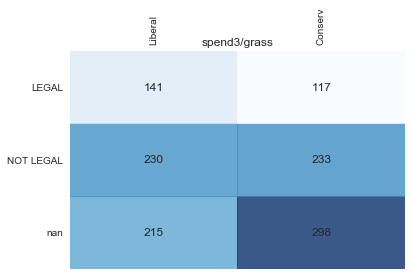

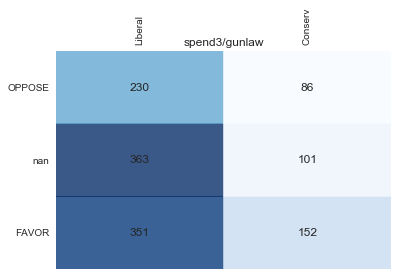

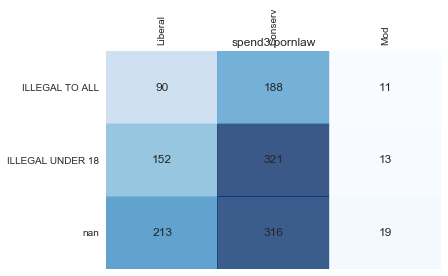

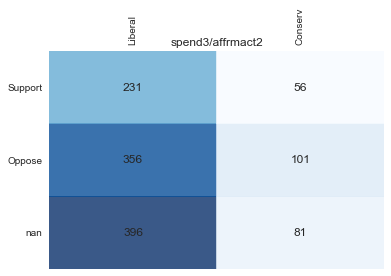

In [76]:

# p=0

for name, item in features_cat.items():
    for i in item:
        for n, k in enumerate(dem_cat):
            f, ax = plt.subplots(figsize=(7, 3))
#             g = sns.countplot(x= k, hue=i, data=pd.DataFrame(cat_dict))
#             xlabels = list(set(pd.DataFrame(cat_dict)[k].tolist()))
            df = pd.DataFrame(cat_dict)
            g1 = sns.barplot(x= k, y=k, hue=i, data=df, estimator=lambda x: len(x) / len(df) * 100, orient="v")
            plt.xticks(rotation=90)
            ax.set(title =name+f'{n}',ylabel="Percent")
        
        
        
        



In [ ]:
for a in self_reported:
    for b in policy:
        counts = (pd.crosstab(pd.DataFrame(cat_dict)[a],pd.DataFrame(cat_dict)[b])).as_matrix().astype(int)
        fig, ax = plt.subplots()
        heatmap = ax.pcolor(counts, cmap=plt.cm.Blues, alpha=0.8)
        fig = plt.gcf()
#             fig.set_size_inches(8, 11)
        ax.set_frame_on(False)
        ax.set_yticks(np.arange(counts.shape[0]) + 0.5, minor=False)
        ax.set_xticks(np.arange(counts.shape[1]) + 0.5, minor=False)
#         ax.invert_yaxis()
        ax.xaxis.tick_top()
        xlabels = list(set(pd.DataFrame(cat_dict)[a].tolist()))
        ylabels = list(set(pd.DataFrame(cat_dict)[b].tolist()))
        ax.set_title ('/'.join([a,b]))
        ax.set_xticklabels(xlabels, minor=False)
        ax.set_yticklabels(ylabels, minor=False)
        plt.xticks(rotation=90)
        ax.grid(False)
        ax = plt.gca()
        for t in ax.xaxis.get_major_ticks():
            t.tick1On = False
            t.tick2On = False
        for t in ax.yaxis.get_major_ticks():
            t.tick1On = False
            t.tick2On = False
        for y in range(counts.shape[0]):
            for x in range(counts.shape[1]):
                plt.text(x + 0.5, y + 0.5, counts[y, x],
                     horizontalalignment='center',
                     verticalalignment='center')

        

## Categorical variable with Numeric Variables
### I. exploring correlation between two numerical variables categorized by one categorical variables

In [7]:
tup1 = (['eqwlth', 'helpblk', 'helpnot'], ['egalit_scale'])
tup2 = (['helpblk', 'helpnot'], ['eqwlth']) 
tup3 = (['helpnot'],['helpblk'])
tup4 = (['childs'],['age'])
tup5 = (['age', 'wordsum'], ['social_trust'])
tup6 = (['wordsum'], ['tolerance'])
tup7 = (['closewht'], ['closeblk'])
relationships = [tup1, tup2, tup3, tup4, tup5, tup6, tup7]
bi_cat = ['sex']
top = ['eqwlth', 'helpblk', 'helpnot', 'egalit_scale']
top1 = ['childs','age','wordsum','social_trust']
cat = ['marital', 'sex', 'partyid_3','degree','ethnic','income06','happy']
df = pd.concat([pd.DataFrame(num_dict), pd.DataFrame(cat_dict)])

D:\programs\Anaconda3\lib\site-packages\matplotlib\pyplot.py:523: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



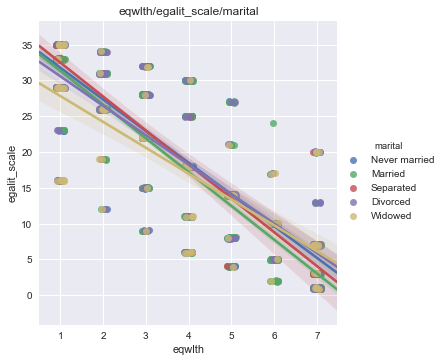

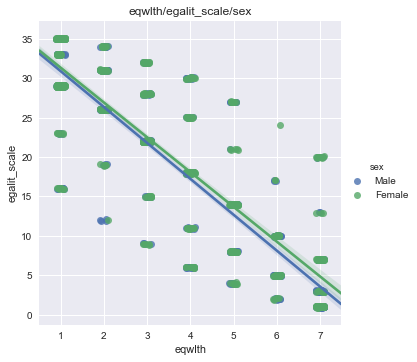

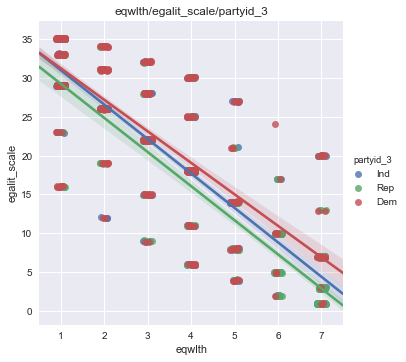

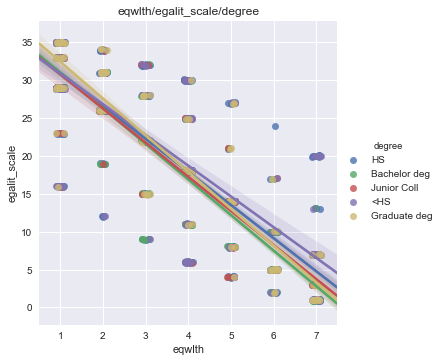

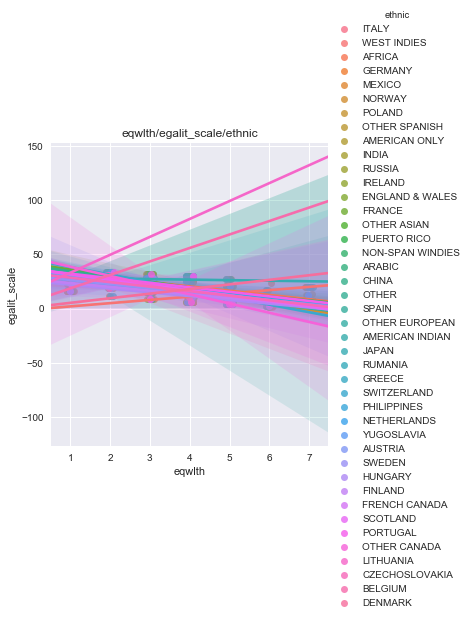

...

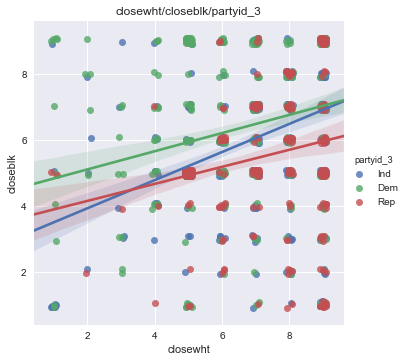

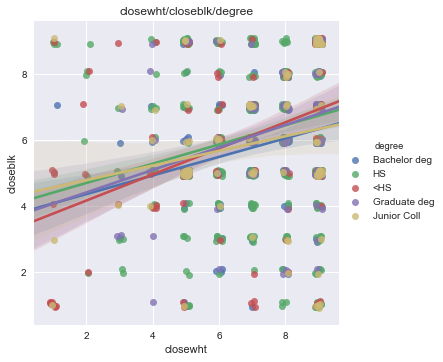

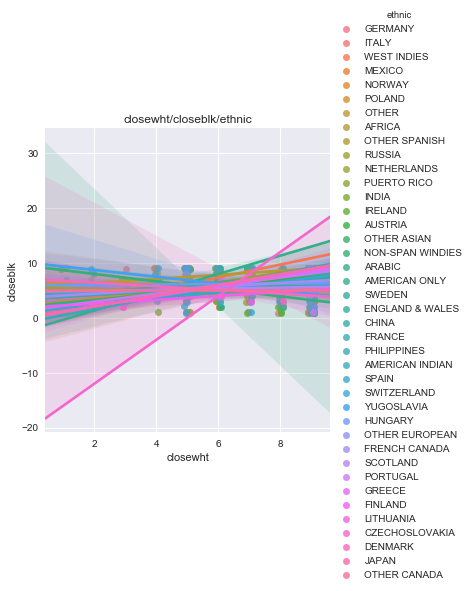

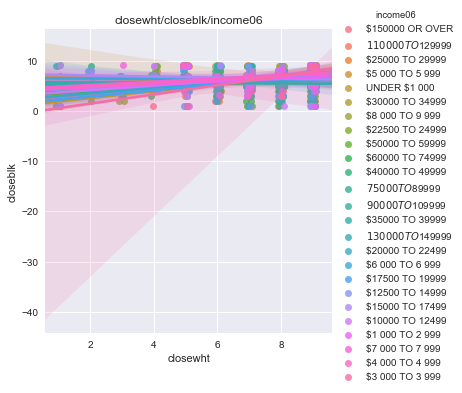

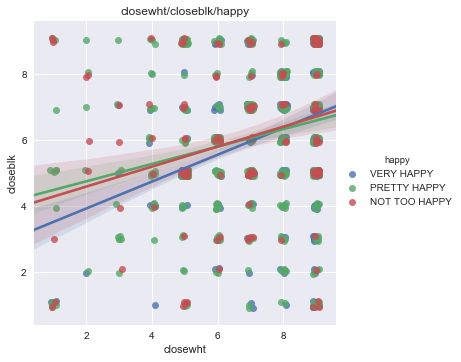

In [92]:


for pre, post in relationships:
    for i in pre:
        for j in post:
            for k in cat:
#                 g = sns.lmplot(x=i, y=j, hue=k, size=5, data=df)
# # Use more informative axis labels than are provided by default
#                 g.set_axis_labels(i,j)
#                 g.set(title = '/'.join([i,j,k]))
                sns.set()        
                g = sns.lmplot(x=i, y=j,hue =k, size=5, x_jitter = 0.1,y_jitter =0.1,data=gss[[i,j,k]].dropna(axis=0, how = 'any'))
#                 break
                # Use more informative axis labels than are provided by default
                g.set_axis_labels(i,j)
                g.set(title = '/'.join([i,j,k]))

                
# sns.set(color_codes=True)
# colors =sns.color_palette("husl", len(df[top+[k]].columns))
# for k in cat:
#     g = sns.pairplot(df[top+[k]],dropna=True, hue=k)
# print(df["sex"])

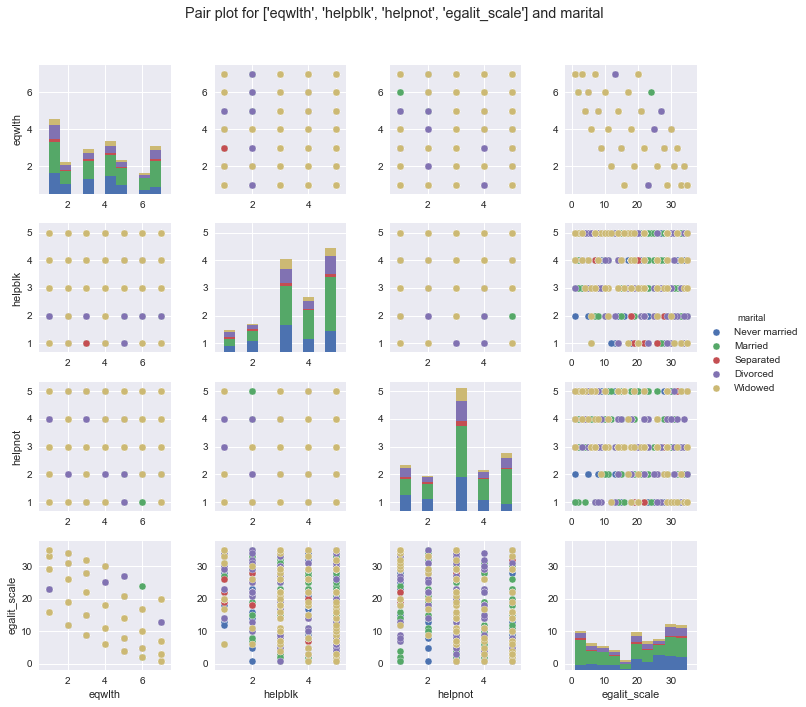

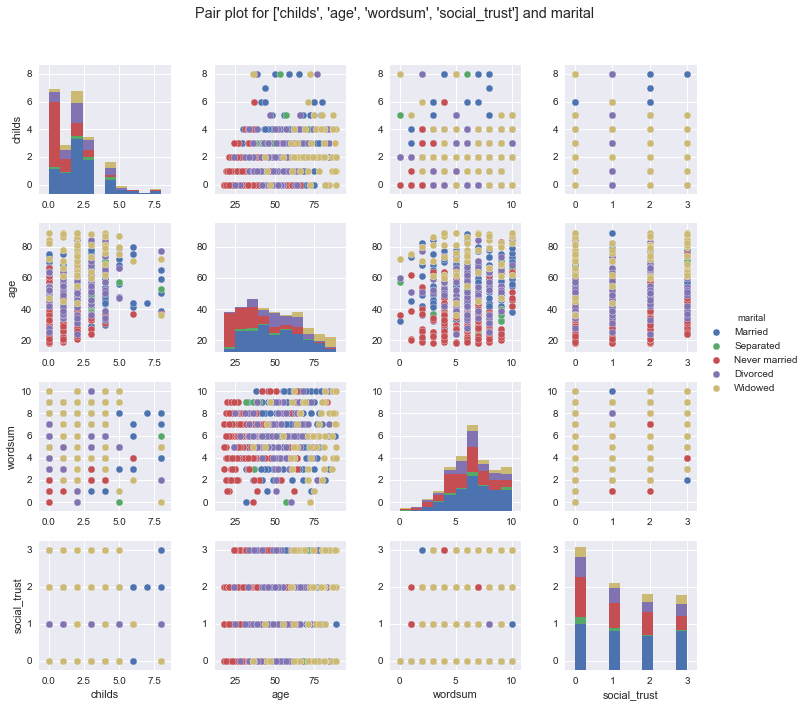

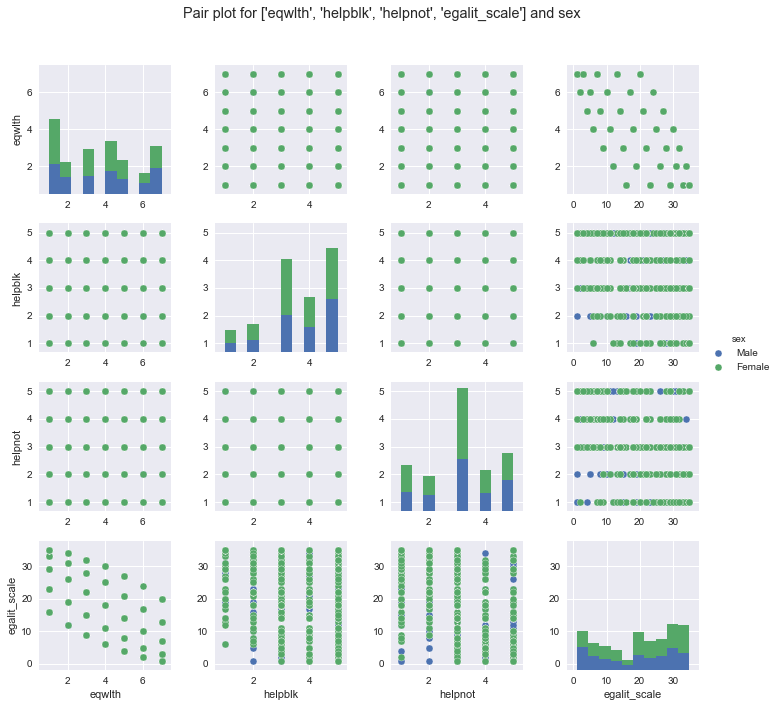

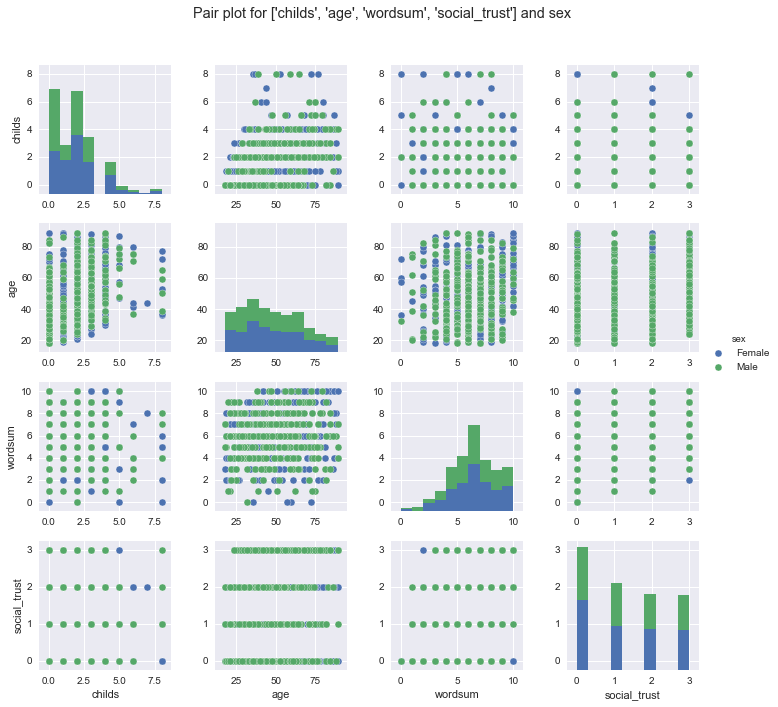

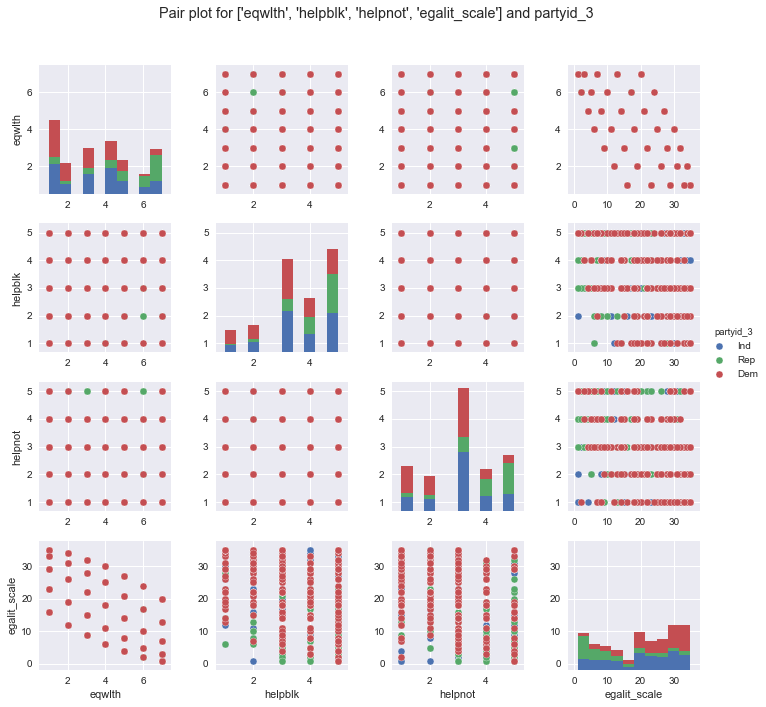

...

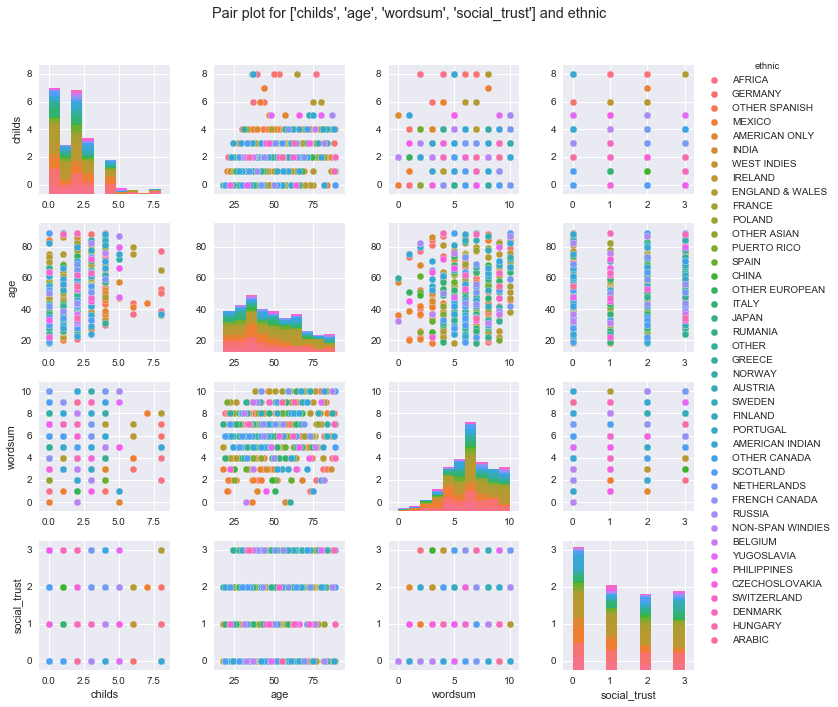

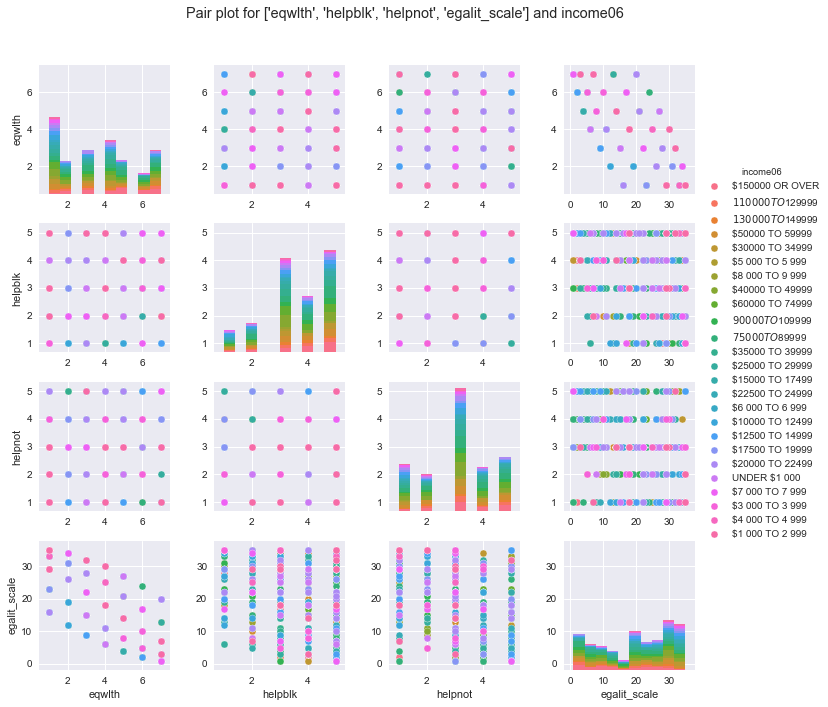

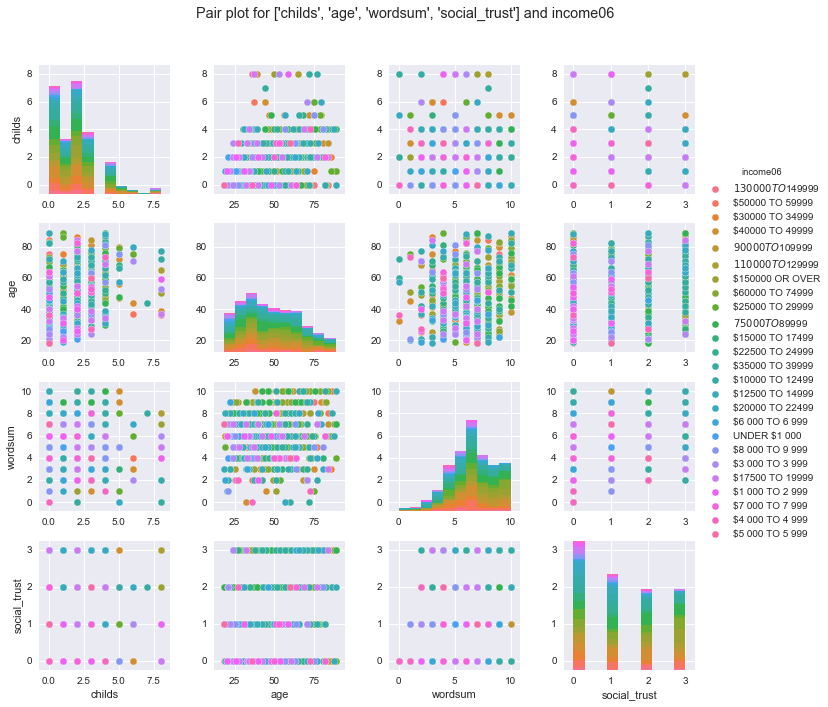

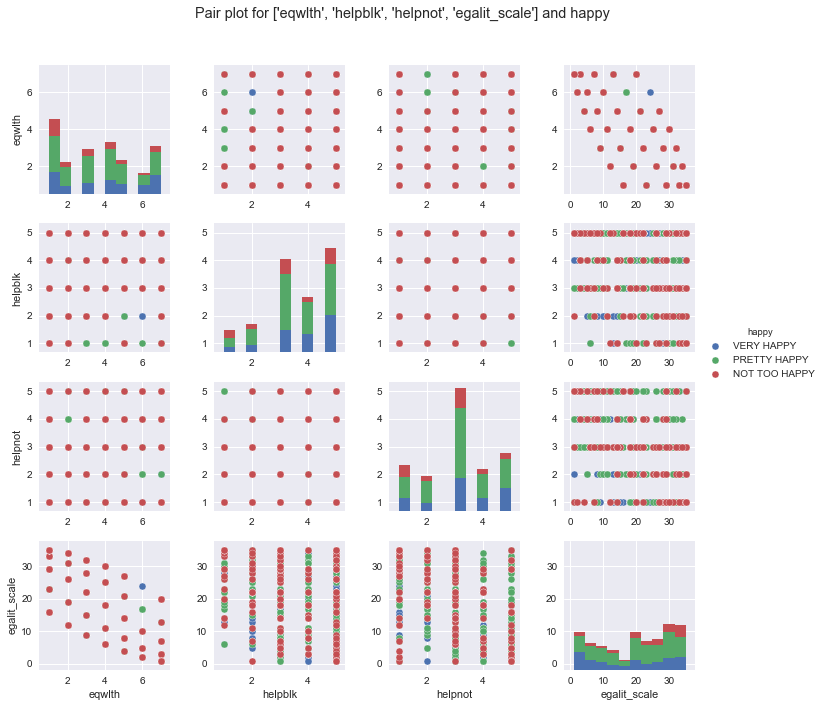

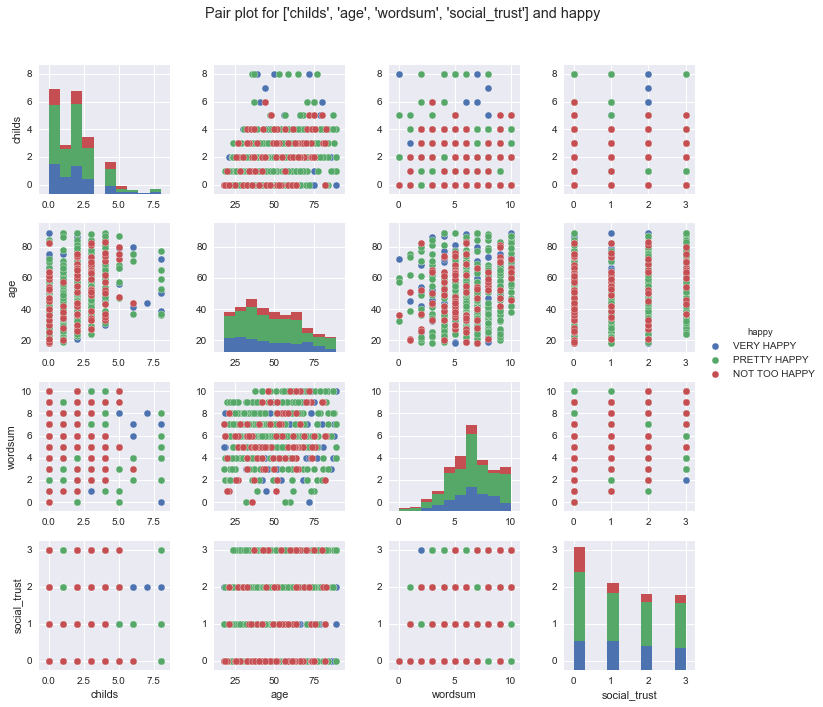

In [91]:

# sns.swarmplot(x="day", y="total_bill", hue="sex", data=tips);
for k in cat:
    g = sns.pairplot(gss[top+[k]].dropna(axis=0, how = 'any'),dropna=True, hue=k)
    plt.subplots_adjust(top=0.9)
    g.fig.suptitle(f'Pair plot for {top} and {k}') 
    g1 = sns.pairplot(gss[top1+[k]].dropna(axis=0, how = 'any'),dropna=True, hue=k)
    plt.subplots_adjust(top=0.9)
    g1.fig.suptitle(f'Pair plot for {top1} and {k}') 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


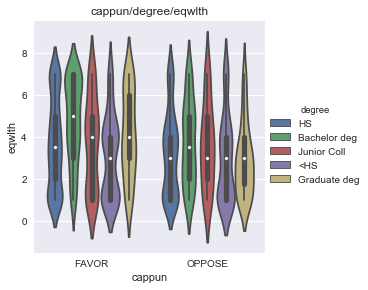

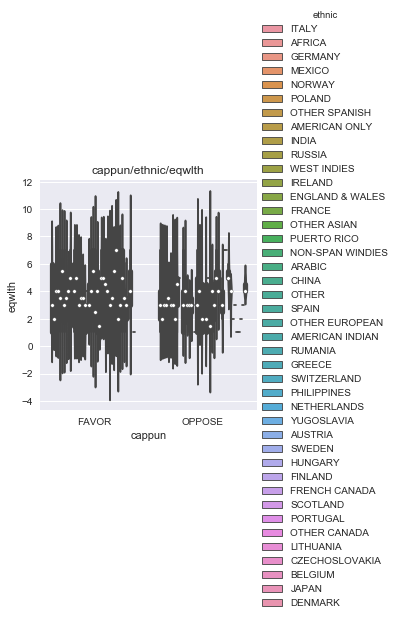

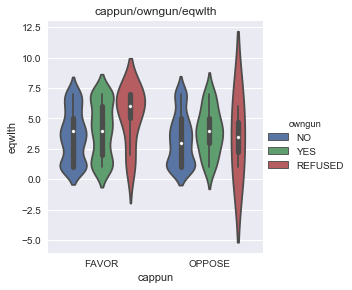

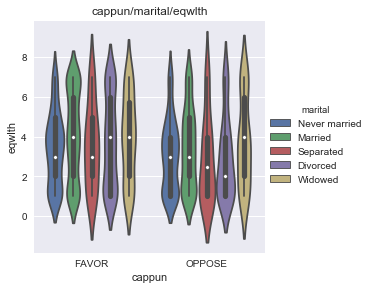

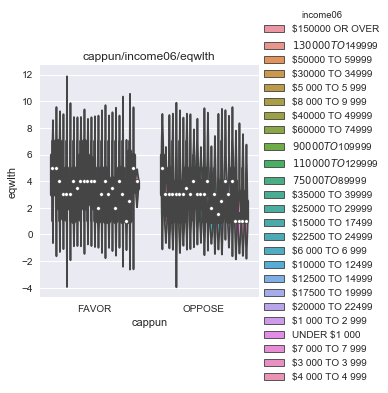

...

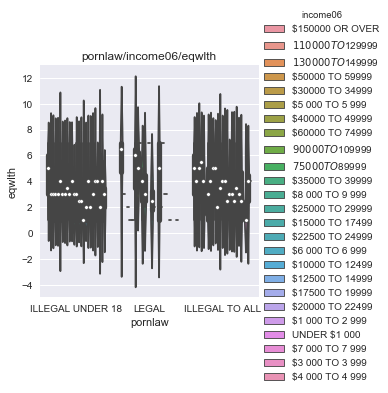

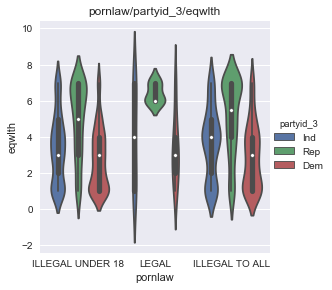

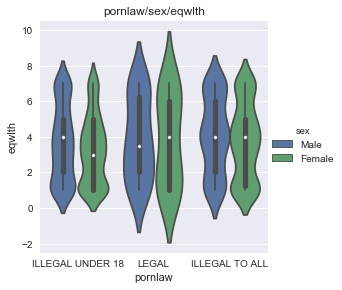

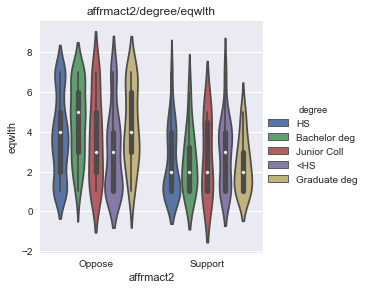

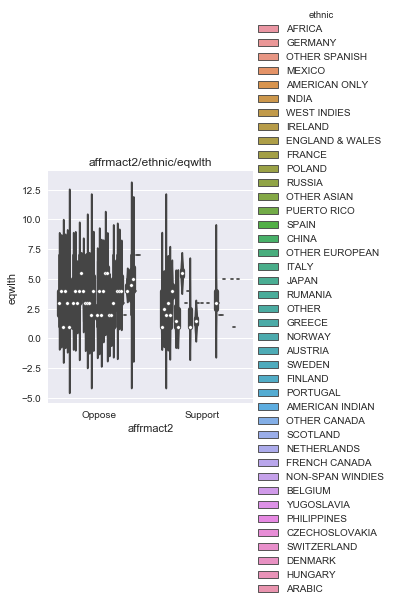

In [10]:
# print (policy+self_reported)
try:
    for nume in top:
        for cat1 in policy+self_reported:
            for cat2 in dem_cat:
#                 df =gss[[nume,cat1,cat2]]
                sns.set()   
                g = sns.factorplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'), kind="violin")
                g.set(title='/'.join([cat1,cat2,nume]), xlabel = cat1, ylabel=nume)
except ValueError:
    pass



D:\programs\Anaconda3\lib\site-packages\seaborn\categorical.py:1508: FutureWarning:

remove_na is deprecated and is a private function. Do not use.

D:\programs\Anaconda3\lib\site-packages\matplotlib\pyplot.py:523: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



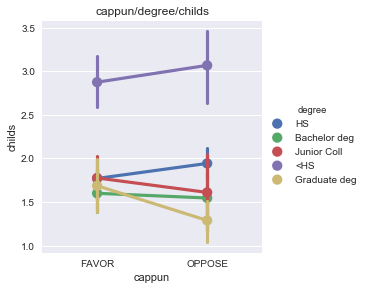

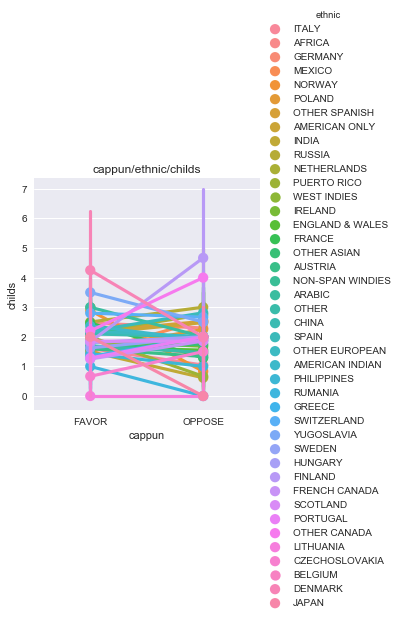

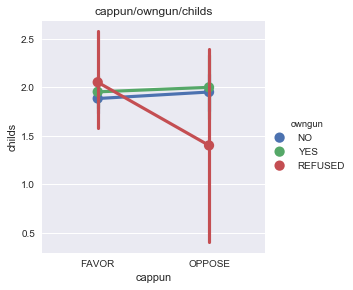

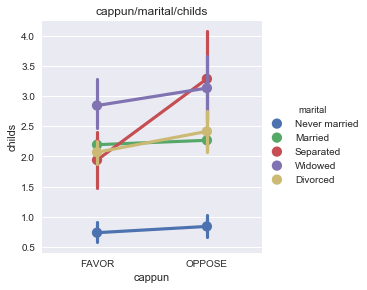

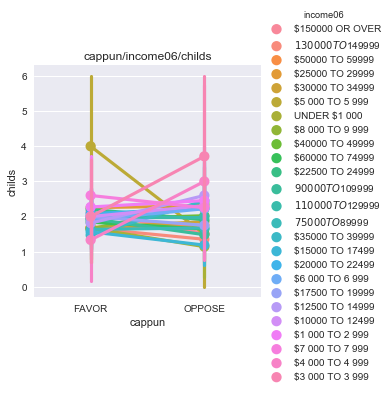

...

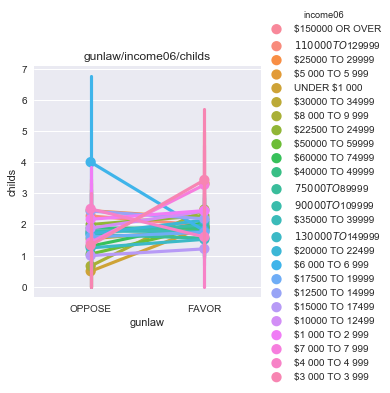

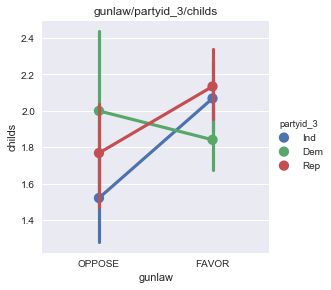

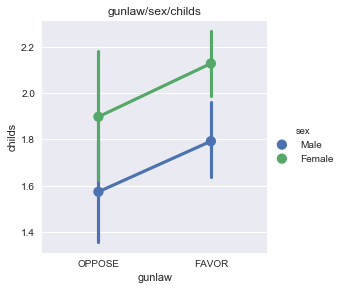

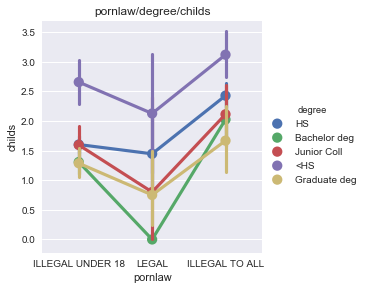

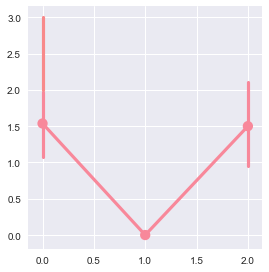

In [107]:
try:
    for nume in top1:
        for cat1 in policy+self_reported:
            for cat2 in dem_cat:
                g = sns.factorplot(x=cat1, y=nume, hue=cat2, data= gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'));
                g.set(title='/'.join([cat1,cat2,nume]), xlabel = cat1, ylabel=nume)
except KeyError and ValueError:
    pass

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


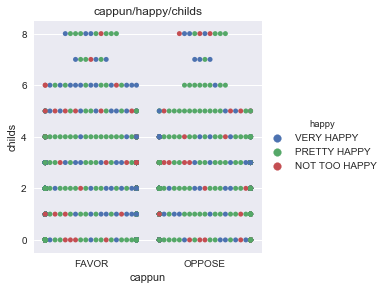

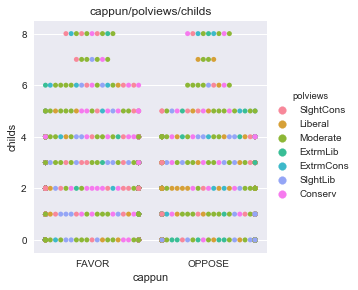

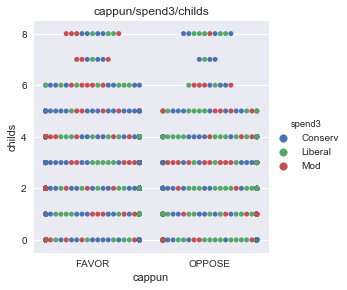

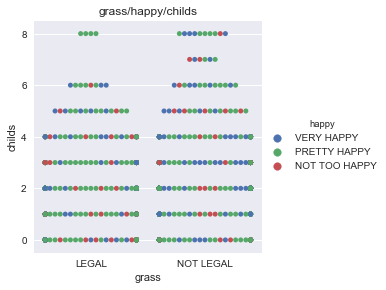

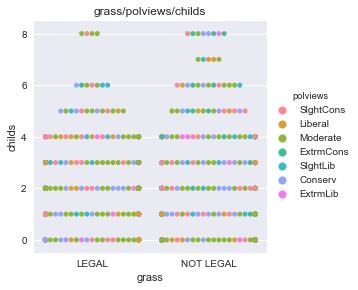

...

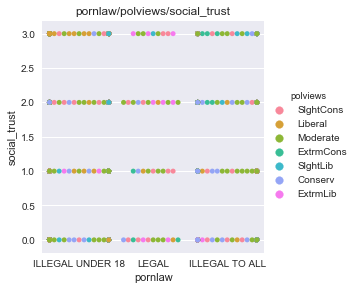

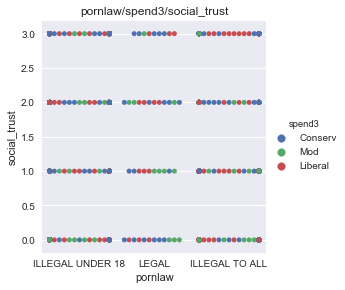

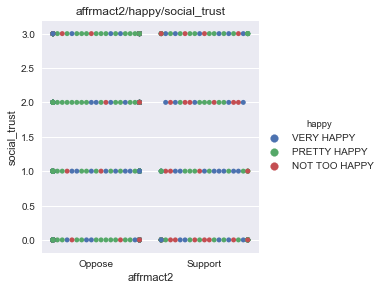

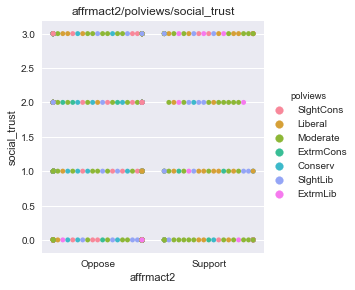

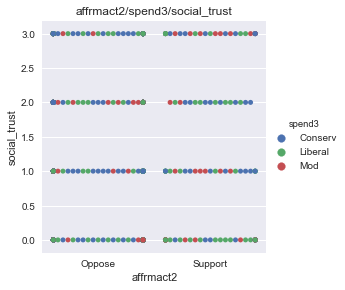

In [12]:
for nume in top1:
    for cat1 in policy:
        for cat2 in self_reported:
            fig, ax = plt.subplots()
            sns.set()
            g=sns.factorplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'), kind="swarm")
               
#             g=sns.violinplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'));
            g.set(title='/'.join([cat1,cat2,nume]), xlabel = cat1, ylabel=nume)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


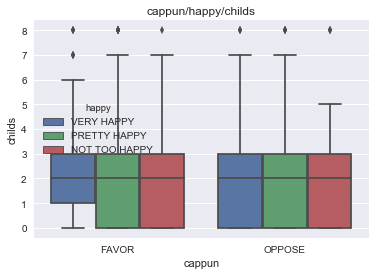

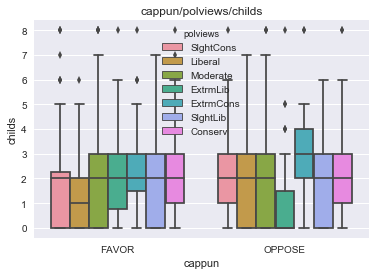

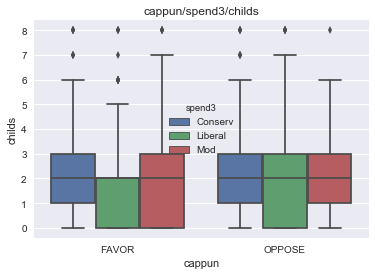

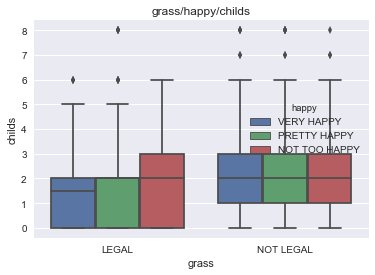

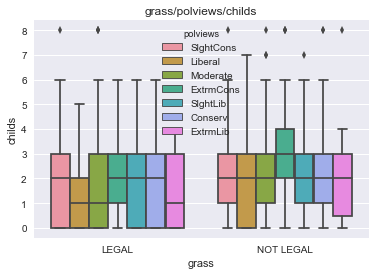

...

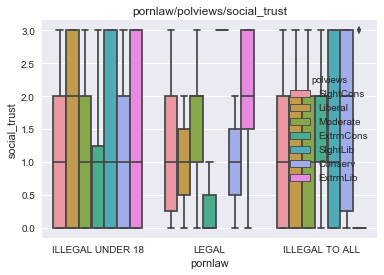

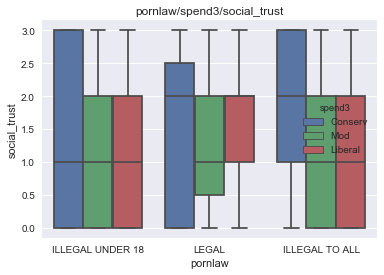

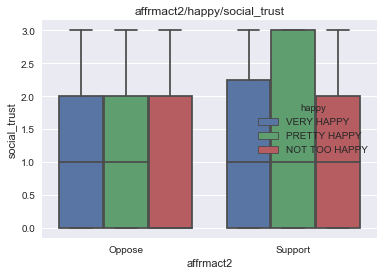

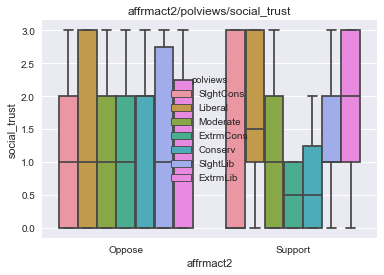

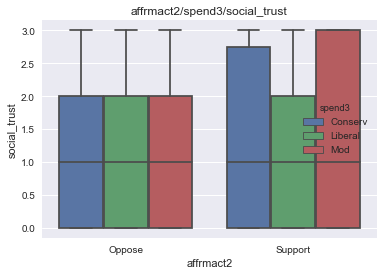

In [13]:
for nume in top1:
    for cat1 in policy:
        for cat2 in self_reported:
            fig, ax = plt.subplots()
            sns.set()
#             g=sns.factorplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'), kind="swarm")
            g = sns.boxplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'))
#             g=sns.violinplot(x=cat1, y=nume, hue=cat2, data=gss[[nume,cat1,cat2]].dropna(axis=0, how = 'any'));
            g.set(title='/'.join([cat1,cat2,nume]), xlabel = cat1, ylabel=nume)